<a href="https://colab.research.google.com/github/Amarty849/X-ray-classification/blob/main/xray2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [10]:
!pip install gdown


In [17]:
import gdown


file_id = "1-SWJ_nIgotQ11ZHapb-uqWndvzeRs80d"
output_file = "Chest_XRay_Datasets.zip"


gdown.download(f"https://drive.google.com/uc?id={file_id}", output_file, quiet=False)



Downloading...
From (original): https://drive.google.com/uc?id=1-SWJ_nIgotQ11ZHapb-uqWndvzeRs80d
From (redirected): https://drive.google.com/uc?id=1-SWJ_nIgotQ11ZHapb-uqWndvzeRs80d&confirm=t&uuid=ed5a70fd-2e82-49d7-b728-2e94805d9888
To: /content/Chest_XRay_Datasets.zip
100%|██████████| 1.01G/1.01G [00:15<00:00, 66.7MB/s]


'Chest_XRay_Datasets.zip'

In [18]:
'Chest_XRay_Datasets.zip'


'Chest_XRay_Datasets.zip'

In [19]:
import zipfile
z = zipfile.ZipFile('/content/Chest_XRay_Datasets.zip')
z.extractall()


In [20]:
import os
import torch
import random
import torch.nn as nn
import matplotlib.pyplot as plt
from torchvision import transforms
from torchvision import datasets
import torch.optim as optim
import torch.nn.functional as F
from PIL import Image, ImageOps
from torch.utils.data import DataLoader, random_split

torch.cuda.is_available()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)


cuda


[1594, 1470]
['PNEUMONIA', 'NORMAL']


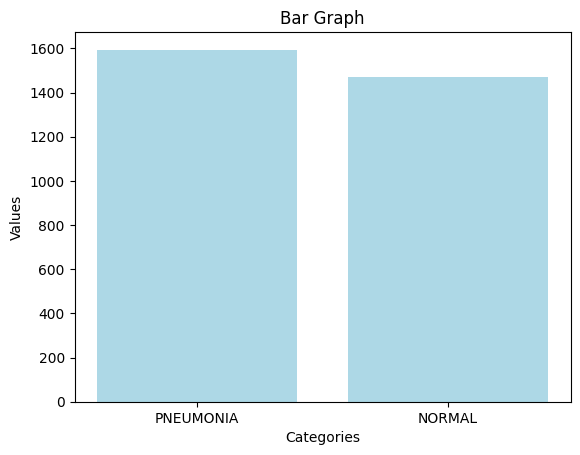

In [21]:
images_dir = "Chest_XRay_Datasets/train"
images_dir_folders = os.listdir(images_dir)

no_img_classes = []

for images_dir_folder in images_dir_folders:
  no_images = os.listdir(os.path.join(images_dir,images_dir_folder))
  no_img_classes.append(len(no_images))

print(no_img_classes)
print(images_dir_folders)


plt.bar(images_dir_folders, no_img_classes, color='lightblue')
plt.xlabel("Categories")
plt.ylabel("Values")
plt.title("Bar Graph")

plt.show()

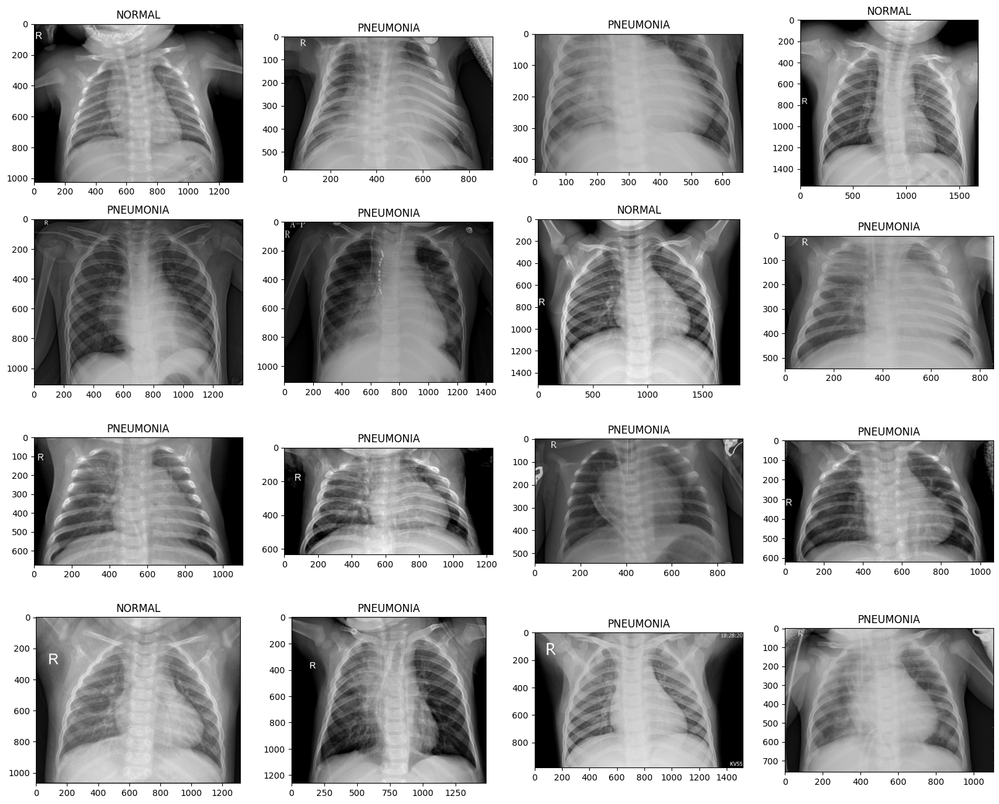

In [22]:
images_dir = "Chest_XRay_Datasets/train"
images_dir_folders = os.listdir(images_dir)

fig,ax = plt.subplots(4,4,figsize=(20,16))
ax = ax.ravel()

for i in range(16):
    images_folder = random.choice(images_dir_folders)
    images_files = os.listdir(os.path.join(images_dir,images_folder))
    img_path = os.path.join(images_dir,images_folder,random.choice(images_files))

    img = Image.open(img_path)
    cls_name = images_folder

    ax[i].imshow(img,cmap='gray')
    ax[i].set_title(cls_name)

plt.show()


In [23]:
transformation = transforms.Compose([
    transforms.Grayscale(num_output_channels=1),
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(15),
    transforms.RandomAffine(degrees=0, translate=(0.1, 0.1), shear=10),
    transforms.GaussianBlur(kernel_size=3, sigma=(0.1, 2.0)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5], std=[0.5])
])


In [24]:

dataset = datasets.ImageFolder(root="Chest_XRay_Datasets/train", transform=transformation)
class_to_idx = dataset.class_to_idx


train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size

train_dataset, val_dataset = random_split(dataset, [train_size, val_size])


traindata = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=2)
valdata = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=2)


print(f"Training samples: {len(train_dataset)}")
print(f"Validation samples: {len(val_dataset)}")



print(class_to_idx)
print(len(train_dataset))
print(len(traindata))


Training samples: 2451
Validation samples: 613
{'NORMAL': 0, 'PNEUMONIA': 1}
2451
77


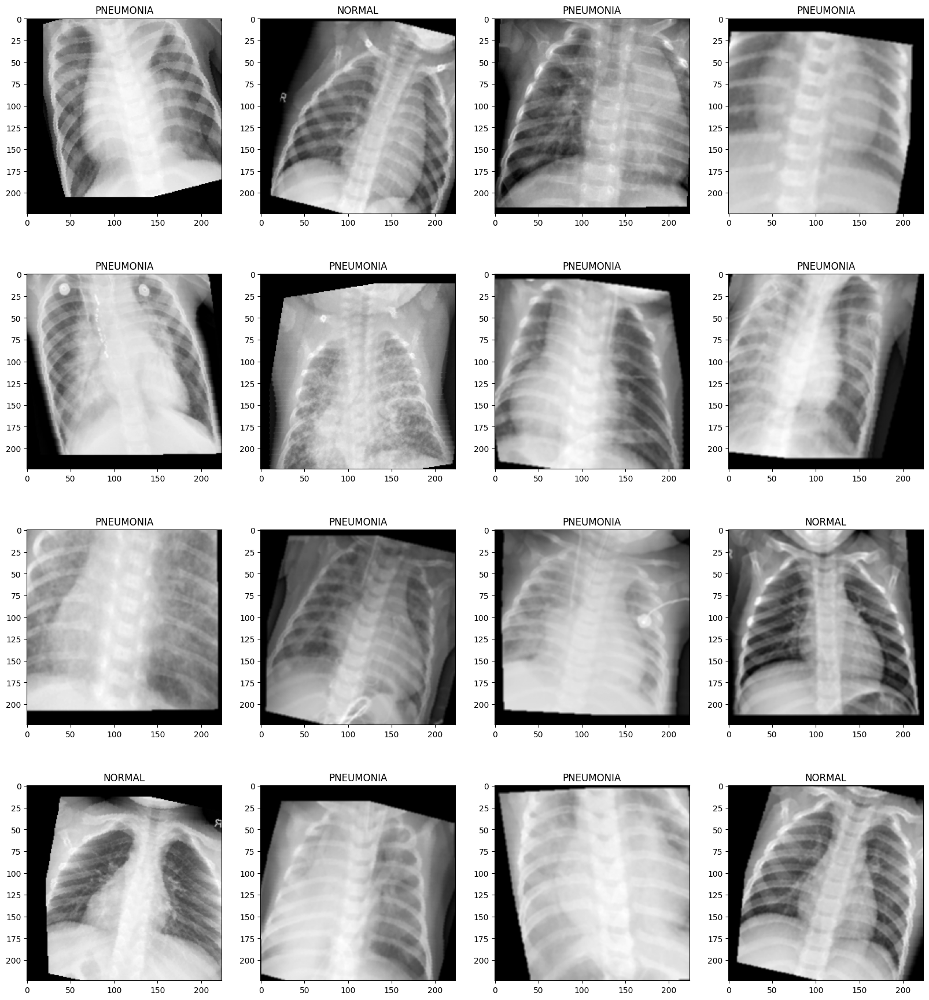

In [25]:
samples,labels = next(iter(traindata))

fig, axes = plt.subplots(4,4,figsize=(20,22))
axes = axes.ravel()

class_names = {0:'NORMAL', 1:'PNEUMONIA'}

for i in range(16):
    axes[i].imshow(samples[i].permute(1,2,0),cmap='gray')

    axes[i].set_title(class_names[labels[i].item()])


In [26]:
class CNN(nn.Module):
    def __init__(self):
        super(CNN,self).__init__()

        self.conv1 = nn.Conv2d(in_channels=1, out_channels=16, kernel_size=3)
        self.batch1 = nn.BatchNorm2d(num_features=16)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv2 = nn.Conv2d(in_channels=16, out_channels=32, kernel_size=3)
        self.batch2 = nn.BatchNorm2d(num_features=32)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv3 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3)
        self.batch3 = nn.BatchNorm2d(num_features=64)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv4 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3)
        self.batch4 = nn.BatchNorm2d(num_features=128)
        self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv5 = nn.Conv2d(in_channels=128, out_channels=512, kernel_size=3)
        self.batch5 = nn.BatchNorm2d(num_features=512)
        self.pool5 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.flatten = nn.Flatten()

        self.fc1 = nn.Linear(in_features=5*5*512, out_features=1024)
        self.fc1_batch = nn.BatchNorm1d(num_features=1024)

        self.fc2 = nn.Linear(in_features=1024, out_features=256)
        self.fc2_batch = nn.BatchNorm1d(num_features=256)

        self.fc3 = nn.Linear(in_features=256, out_features=128)
        self.fc3_batch = nn.BatchNorm1d(num_features=128)

        self.fc4 = nn.Linear(in_features=128, out_features=3)

        self.softmax = nn.Softmax(dim=1)


    def forward(self,x):
        x = self.conv1(x)
        x = self.batch1(x)
        x = F.relu(x)
        x = self.pool1(x)

        x = self.conv2(x)
        x = self.batch2(x)
        x = F.relu(x)
        x = self.pool2(x)

        x = self.conv3(x)
        x = self.batch3(x)
        x = F.relu(x)
        x = self.pool3(x)

        x = self.conv4(x)
        x = self.batch4(x)
        x = F.relu(x)
        x = self.pool4(x)

        x = self.conv5(x)
        x = self.batch5(x)
        x = F.relu(x)
        x = self.pool5(x)

        x = self.flatten(x)

        x = self.fc1(x)
        x = self.fc1_batch(x)
        x = F.relu(x)

        x = self.fc2(x)
        x = self.fc2_batch(x)
        x = F.relu(x)

        x = self.fc3(x)
        x = self.fc3_batch(x)
        x = F.relu(x)

        x = self.fc4(x)
        x = self.softmax(x)

        return x

model = CNN().to(device)


In [27]:
from torchsummary import summary
summary(model, (1,224,224)) # (C,H,W)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 222, 222]             160
       BatchNorm2d-2         [-1, 16, 222, 222]              32
         MaxPool2d-3         [-1, 16, 111, 111]               0
            Conv2d-4         [-1, 32, 109, 109]           4,640
       BatchNorm2d-5         [-1, 32, 109, 109]              64
         MaxPool2d-6           [-1, 32, 54, 54]               0
            Conv2d-7           [-1, 64, 52, 52]          18,496
       BatchNorm2d-8           [-1, 64, 52, 52]             128
         MaxPool2d-9           [-1, 64, 26, 26]               0
           Conv2d-10          [-1, 128, 24, 24]          73,856
      BatchNorm2d-11          [-1, 128, 24, 24]             256
        MaxPool2d-12          [-1, 128, 12, 12]               0
           Conv2d-13          [-1, 512, 10, 10]         590,336
      BatchNorm2d-14          [-1, 512,

In [28]:
criterian = nn.CrossEntropyLoss().to(device)
optimizer = optim.Adam(model.parameters(), lr=0.0001)
epochs = 30

In [29]:
import os
import torch

train_loss = []
train_accuracy = []
val_loss = []
val_accuracy = []


best_val_loss = float('inf')


checkpoint_dir = "checkpoints"
os.makedirs(checkpoint_dir, exist_ok=True)


scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

for epoch in range(epochs):
    model.train()
    correct = 0
    train_running_loss = 0.0

    for data,labels in traindata:
        data,labels = data.to(device), labels.to(device)
        optimizer.zero_grad()
        output = model(data)
        loss = criterian(output, labels)
        loss.backward()
        optimizer.step()

        train_running_loss += loss.item()

        _,pred = torch.max(output,1)

        correct += (pred == labels).sum().item()

    epoch_train_loss = train_running_loss / len(traindata)
    epoch_train_accuracy = (100 * correct) / len(train_dataset)
    train_loss.append(epoch_train_loss)
    train_accuracy.append(epoch_train_accuracy)

    print(f'Epoch: {epoch+1} Training Loss: {epoch_train_loss} Training Accuracy: {epoch_train_accuracy}')

    with torch.no_grad():
        model.eval()
        correct = 0
        val_running_loss = 0.0
        for val_data, val_labels in valdata:
            val_data, val_labels = val_data.to(device), val_labels.to(device)
            val_output = model(val_data)
            val_loss_value = criterian(val_output, val_labels)

            val_running_loss += val_loss_value.item()
            _,val_pred = torch.max(val_output,1)
            correct += (val_pred == val_labels).sum().item()

        epoch_val_loss = val_running_loss / len(valdata)
        epoch_val_accuracy = (100 * correct) / len(val_dataset)
        val_loss.append(epoch_val_loss)
        val_accuracy.append(epoch_val_accuracy)

        print(f'Epoch: {epoch+1} Validation Loss: {epoch_val_loss} Validation Accuracy: {epoch_val_accuracy}')



        if epoch_val_loss < best_val_loss:
            best_val_loss = epoch_val_loss
            checkpoint_path = os.path.join(checkpoint_dir, f"best_model.pth")
            torch.save(model.state_dict(), checkpoint_path)
            print(f"🔥 Best model saved at {checkpoint_path} with Validation Loss: {epoch_val_loss:.4f}")


    scheduler.step()
    print(f"🔄 Updated Learning Rate: {scheduler.get_last_lr()[0]:.6f}\n")

    print("\n")

Epoch: 1 Training Loss: 0.7587849644871502 Training Accuracy: 86.61770705834353
Epoch: 1 Validation Loss: 0.7081217914819717 Validation Accuracy: 90.2120717781403
🔥 Best model saved at checkpoints/best_model.pth with Validation Loss: 0.7081
🔄 Updated Learning Rate: 0.000100



Epoch: 2 Training Loss: 0.6696579053804472 Training Accuracy: 91.47286821705427
Epoch: 2 Validation Loss: 0.6634280681610107 Validation Accuracy: 91.68026101141925
🔥 Best model saved at checkpoints/best_model.pth with Validation Loss: 0.6634
🔄 Updated Learning Rate: 0.000099



Epoch: 3 Training Loss: 0.6465202647370177 Training Accuracy: 92.45206038351694
Epoch: 3 Validation Loss: 0.6463374853134155 Validation Accuracy: 91.19086460032626
🔥 Best model saved at checkpoints/best_model.pth with Validation Loss: 0.6463
🔄 Updated Learning Rate: 0.000098



Epoch: 4 Training Loss: 0.636516663161191 Training Accuracy: 92.77845777233782
Epoch: 4 Validation Loss: 0.6497518748044968 Validation Accuracy: 91.02773246329527
🔄

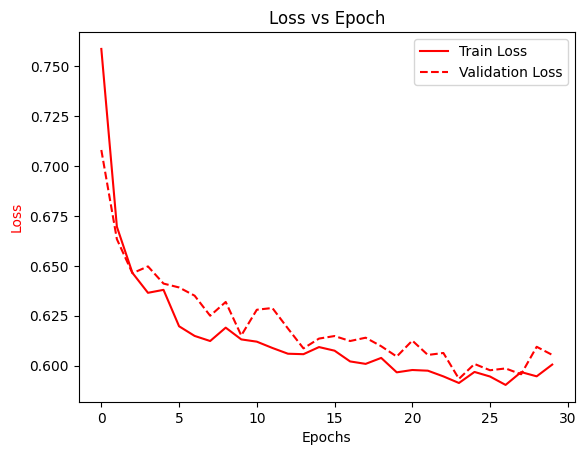

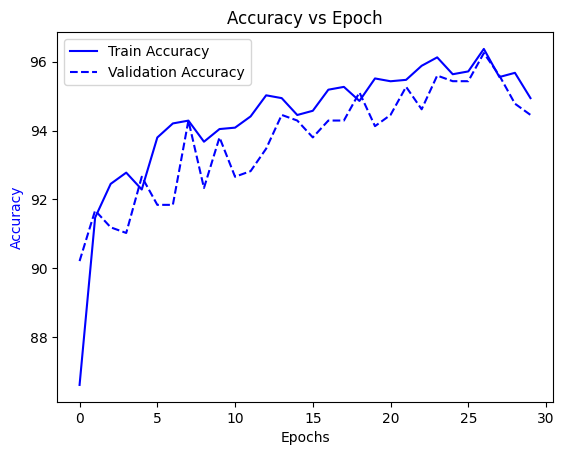

In [30]:

epoch_log = [*range(epochs)]

fig,ax1 = plt.subplots()
ax1.plot(epoch_log,train_loss,'r-',label = 'Train Loss')
ax1.plot(epoch_log,val_loss,'r--',label = 'Validation Loss')
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Loss',color='r')
ax1.set_title('Loss vs Epoch')
ax1.legend()
plt.show()

fig,ax2 = plt.subplots()
ax2.plot(epoch_log,train_accuracy,'b-',label = 'Train Accuracy')
ax2.plot(epoch_log,val_accuracy,'b--',label = 'Validation Accuracy')
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Accuracy',color='b')
ax2.set_title('Accuracy vs Epoch')
ax2.legend()
plt.show()

In [31]:

model = CNN()
model.load_state_dict(torch.load("checkpoints/best_model.pth"))
model.to(device)
model.eval()

CNN(
  (conv1): Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1))
  (batch1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1))
  (batch2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1))
  (batch3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1))
  (batch4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv5): Conv2d(128, 512, kernel_siz

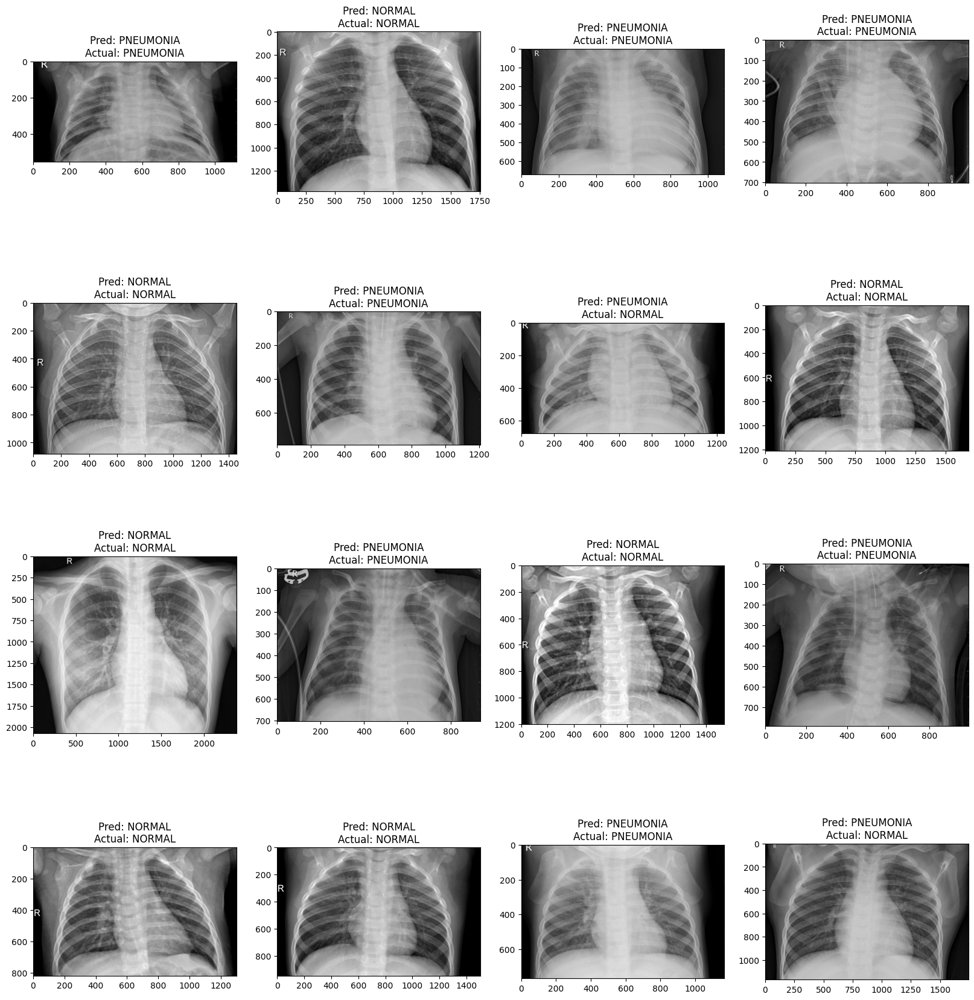

In [32]:
import random

test_dir = "Chest_XRay_Datasets/test"
test_dir_folders = os.listdir(test_dir)

images = []
def preprocessing(image):
    img = transformation(image)
    img = img.unsqueeze(0)
    return img

fig, axes = plt.subplots(4,4,figsize=(20,22))
axes = axes.ravel()

class_names = {0:'NORMAL', 1:'PNEUMONIA'}

for i in range(16):
    img_folder = random.choice(test_dir_folders)
    img_filenames = os.listdir(os.path.join(test_dir,img_folder))
    img_path = os.path.join(test_dir, img_folder, random.choice(img_filenames))

    image = Image.open(img_path)
    preprocessed_img = ImageOps.grayscale(image)
    preprocessed_img = preprocessing(preprocessed_img)
    preprocessed_img = preprocessed_img.to(device)

    output = model(preprocessed_img)
    pred = torch.argmax(output).item()
    label = class_names[pred]

    axes[i].imshow(image,cmap='gray')
    axes[i].set_title(f'Pred: {label}\nActual: {img_folder}')

plt.show()


In [33]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import torch

def plot_confusion_matrix(model, dataloader, classes, device):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            _, preds = torch.max(outputs, 1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Confusion matrix create
    cm = confusion_matrix(all_labels, all_preds)

    # Plot matrix
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
    disp.plot(cmap="Blues", values_format='d')
    plt.title("Confusion Matrix")
    plt.show()


In [34]:
classes = ["NORMAL", "PNEUMONIA"]


In [35]:
plot_confusion_matrix(model, test_loader, classes, device)


NameError: name 'test_loader' is not defined

In [36]:
import torch
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt

def evaluate_model(model, dataloader, classes, device):

    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            _, preds = torch.max(outputs, 1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # ---------------------------
    # CONFUSION MATRIX
    # ---------------------------
    cm = confusion_matrix(all_labels, all_preds)

    plt.figure(figsize=(6, 6))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
    disp.plot(cmap="Blues", values_format='d')
    plt.title("Confusion Matrix")
    plt.show()

    # ---------------------------
    # METRICS
    # ---------------------------
    acc = accuracy_score(all_labels, all_preds)
    prec = precision_score(all_labels, all_preds, average="macro")
    rec = recall_score(all_labels, all_preds, average="macro")
    f1 = f1_score(all_labels, all_preds, average="macro")

    print("\n===== METRICS =====")
    print(f"Accuracy:  {acc:.4f}")
    print(f"Precision: {prec:.4f}")
    print(f"Recall:    {rec:.4f}")
    print(f"F1 Score:  {f1:.4f}")

    return cm, acc, prec, rec, f1


In [37]:
classes = ["NORMAL", "PNEUMONIA"]


In [38]:
cm, acc, prec, rec, f1 = evaluate_model(model, test_loader, classes, device)


NameError: name 'test_loader' is not defined

In [39]:
dataset = datasets.ImageFolder("/content/Chest_XRay_Datasets/train", transform=test_transforms)

test_size = int(0.2 * len(dataset))
train_size = len(dataset) - test_size

train_dataset, test_dataset = random_split(dataset, [train_size, test_size])

test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)


NameError: name 'test_transforms' is not defined

In [40]:
test_dir = "/content/Chest_XRay_Datasets/test"  # path ko sahi rakhna

test_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

test_dataset = datasets.ImageFolder(test_dir, transform=test_transforms)

test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)


In [41]:
cm, acc, prec, rec, f1 = evaluate_model(model, test_loader, classes, device)


RuntimeError: Given groups=1, weight of size [16, 1, 3, 3], expected input[32, 3, 224, 224] to have 1 channels, but got 3 channels instead

In [42]:
test_transforms = transforms.Compose([
    transforms.Grayscale(num_output_channels=1),   # ADD THIS
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])


In [43]:
transforms.Grayscale(num_output_channels=1),


(Grayscale(num_output_channels=1),)

In [44]:
for img, label in test_loader:
    print(img.shape)
    break


torch.Size([32, 3, 224, 224])


In [45]:
test_transforms = transforms.Compose([
    transforms.Grayscale(num_output_channels=1),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])


In [46]:
test_dir = "/content/Chest_XRay_Datasets/test"

test_dataset = datasets.ImageFolder(test_dir, transform=test_transforms)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

classes = test_dataset.classes
print("Classes:", classes)


Classes: ['NORMAL', 'PNEUMONIA']


<Figure size 600x600 with 0 Axes>

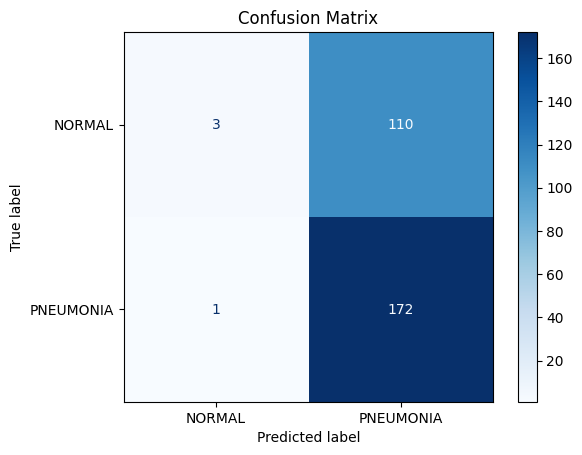


===== METRICS =====
Accuracy:  0.6119
Precision: 0.6800
Recall:    0.5104
F1 Score:  0.4037


In [47]:
cm, acc, prec, rec, f1 = evaluate_model(model, test_loader, classes, device)


In [48]:
model = model.to(device)


In [49]:
images = images.to(device)
labels = labels.to(device)


AttributeError: 'list' object has no attribute 'to'

In [50]:
for batch in test_loader:
    print(type(batch))
    print(len(batch))
    break


<class 'list'>
2


In [51]:
for data in test_loader:
    images, labels = data   # unpack
    images = images.to(device)
    labels = labels.to(device)


In [52]:
with torch.no_grad():
    for data in dataloader:
        images, labels = data

        if isinstance(images, list):
            images = torch.stack(images)

        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images)
        _, preds = torch.max(outputs, 1)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())


NameError: name 'dataloader' is not defined

In [53]:
with torch.no_grad():
    for data in test_loader:
        images, labels = data

        if isinstance(images, list):
            images = torch.stack(images)

        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images)
        _, preds = torch.max(outputs, 1)


In [54]:
def evaluate_model(model, test_loader, classes, device):
    model.eval()

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for data in test_loader:
            images, labels = data

            # if images is a list -> convert to tensor batch
            if isinstance(images, list):
                images = torch.stack(images)

            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            _, preds = torch.max(outputs, 1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # confusion matrix
    cm = confusion_matrix(all_labels, all_preds)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
    disp.plot(cmap="Blues", values_format="d")
    plt.show()

    # metrics
    acc = accuracy_score(all_labels, all_preds)
    prec = precision_score(all_labels, all_preds, average="macro")
    rec = recall_score(all_labels, all_preds, average="macro")
    f1 = f1_score(all_labels, all_preds, average="macro")

    print("Accuracy:", acc)
    print("Precision:", prec)
    print("Recall:", rec)
    print("F1 Score:", f1)

    return cm, acc, prec, rec, f1


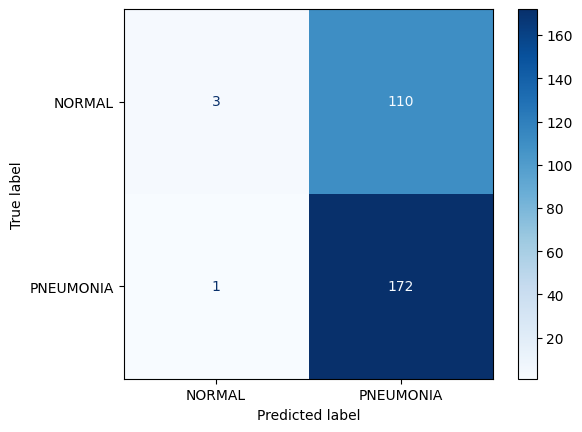

Accuracy: 0.6118881118881119
Precision: 0.6799645390070922
Recall: 0.5103841628727812
F1 Score: 0.40366300366300367


In [55]:
cm, acc, prec, rec, f1 = evaluate_model(model, test_loader, classes, device)


In [56]:
train_transforms = transforms.Compose([
    transforms.Grayscale(num_output_channels=1),
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.RandomAffine(0, translate=(0.05, 0.05)),
    transforms.ToTensor(),
])


In [57]:
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)


In [58]:
criterion = nn.CrossEntropyLoss()


In [59]:
train_losses = []


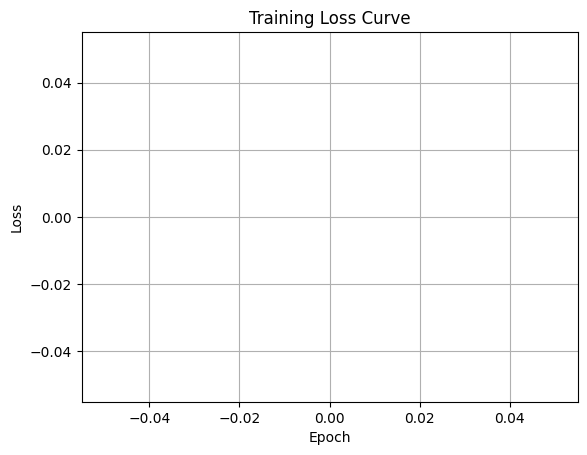

In [60]:
plt.plot(train_losses)
plt.title("Training Loss Curve")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.grid(True)
plt.show()


In [61]:
train_losses = []
val_losses = []


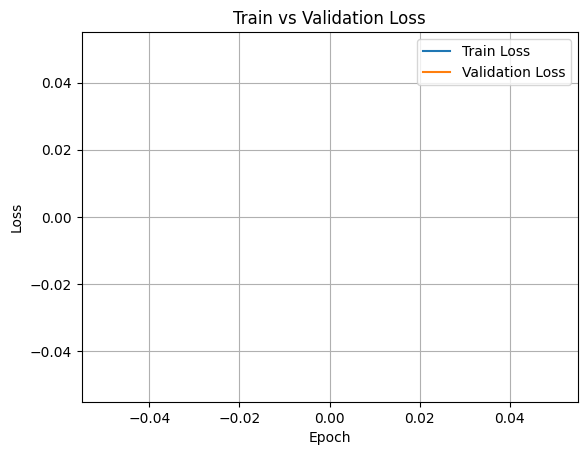

In [62]:
plt.plot(train_losses, label="Train Loss")
plt.plot(val_losses, label="Validation Loss")
plt.title("Train vs Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()


In [63]:
train_acc = []
val_acc = []


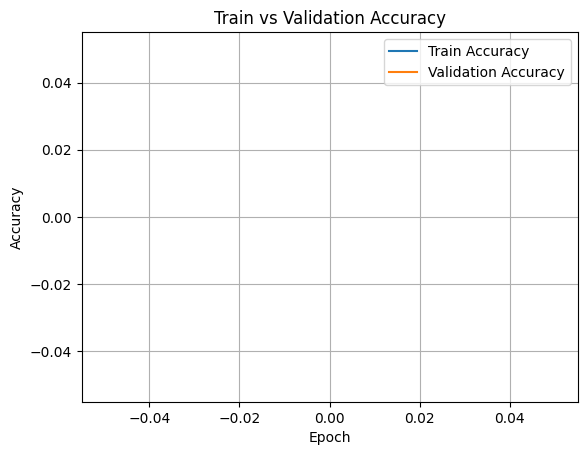

In [64]:
plt.plot(train_acc, label="Train Accuracy")
plt.plot(val_acc, label="Validation Accuracy")
plt.title("Train vs Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)
plt.show()


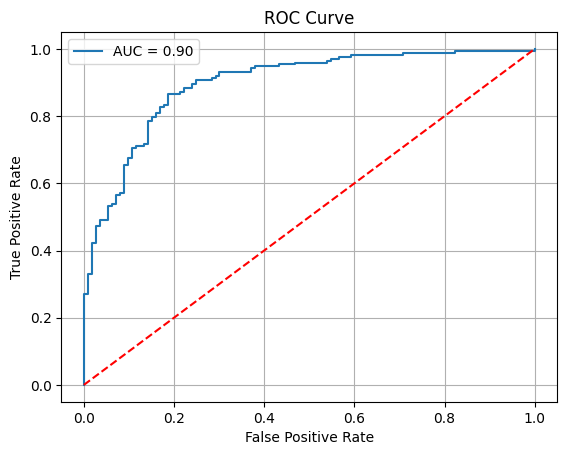

In [65]:
from sklearn.metrics import roc_curve, auc

model.eval()
y_true = []
y_scores = []

with torch.no_grad():
    for images, labels in test_loader:

        if isinstance(images, list):
            images = torch.stack(images)

        images = images.to(device)

        outputs = model(images)
        probs = torch.softmax(outputs, dim=1)[:, 1]

        y_true.extend(labels.numpy())
        y_scores.extend(probs.cpu().numpy())

fpr, tpr, thresholds = roc_curve(y_true, y_scores)
roc_auc = auc(fpr, tpr)

plt.plot(fpr, tpr, label=f"AUC = {roc_auc:.2f}")
plt.plot([0, 1], [0, 1], "r--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.grid(True)
plt.show()


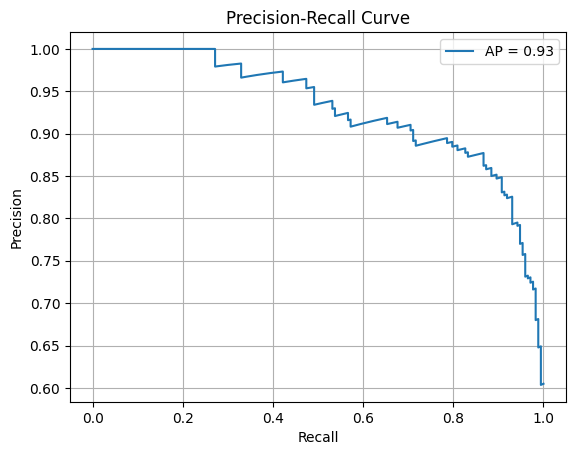

In [66]:
from sklearn.metrics import precision_recall_curve, average_precision_score

precision, recall, thresholds = precision_recall_curve(y_true, y_scores)
avg_precision = average_precision_score(y_true, y_scores)

plt.plot(recall, precision, label=f"AP = {avg_precision:.2f}")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve")
plt.legend()
plt.grid(True)
plt.show()


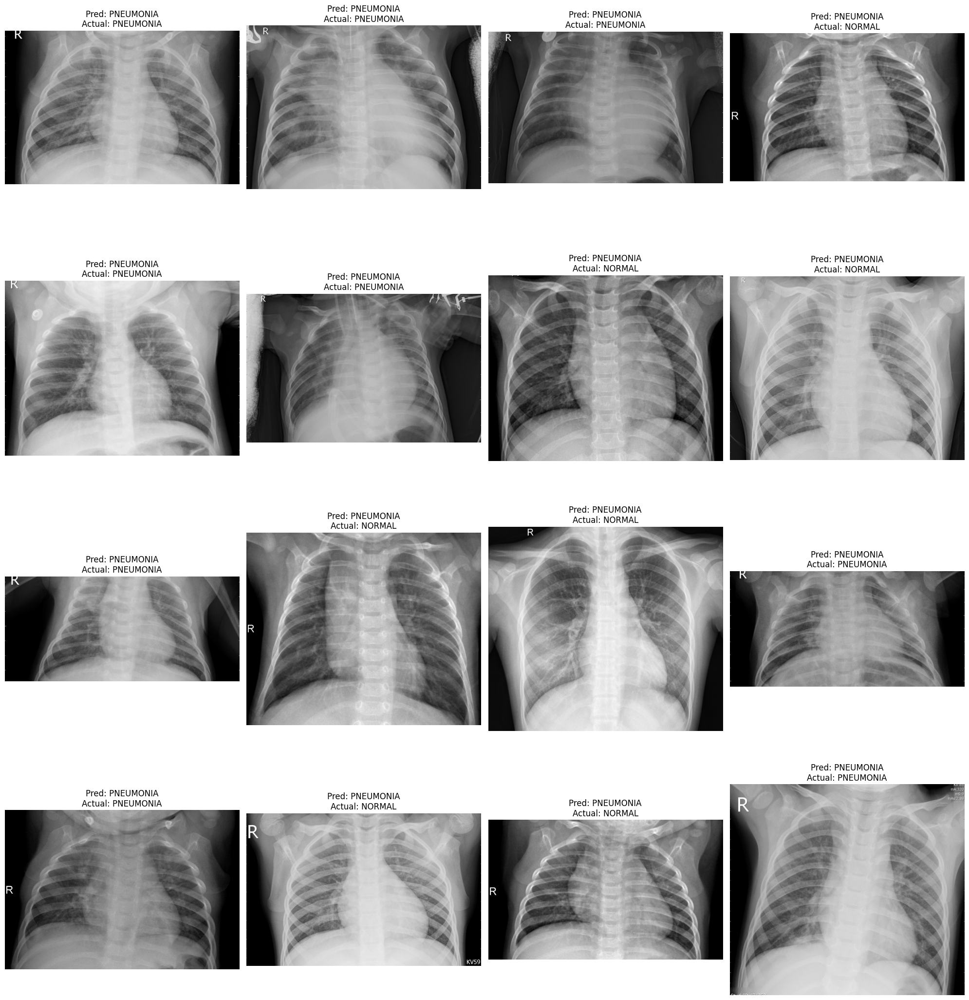

In [67]:
import os
import random
import torch
import matplotlib.pyplot as plt
from PIL import Image, ImageOps
from torchvision import transforms

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Test directory
test_dir = "/content/Chest_XRay_Datasets/test"
test_dir_folders = os.listdir(test_dir)

# Grayscale transform for your model
transformation = transforms.Compose([
    transforms.Grayscale(num_output_channels=1),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

# Preprocessing function
def preprocessing(image):
    img = transformation(image)
    img = img.unsqueeze(0)
    return img

# Class labels
class_names = {0: 'NORMAL', 1: 'PNEUMONIA'}

# Plotting grid
fig, axes = plt.subplots(4, 4, figsize=(20, 22))
axes = axes.ravel()

for i in range(16):
    img_folder = random.choice(test_dir_folders)
    img_filenames = os.listdir(os.path.join(test_dir, img_folder))
    img_path = os.path.join(test_dir, img_folder, random.choice(img_filenames))

    image = Image.open(img_path).convert("L")   # convert to grayscale

    preprocessed_img = preprocessing(image)
    preprocessed_img = preprocessed_img.to(device)

    # Prediction
    with torch.no_grad():
        output = model(preprocessed_img)
        pred = torch.argmax(output).item()

    label = class_names[pred]

    # Show result
    axes[i].imshow(image, cmap='gray')
    axes[i].set_title(f"Pred: {label}\nActual: {img_folder}", fontsize=12)
    axes[i].axis('off')

plt.tight_layout()
plt.show()


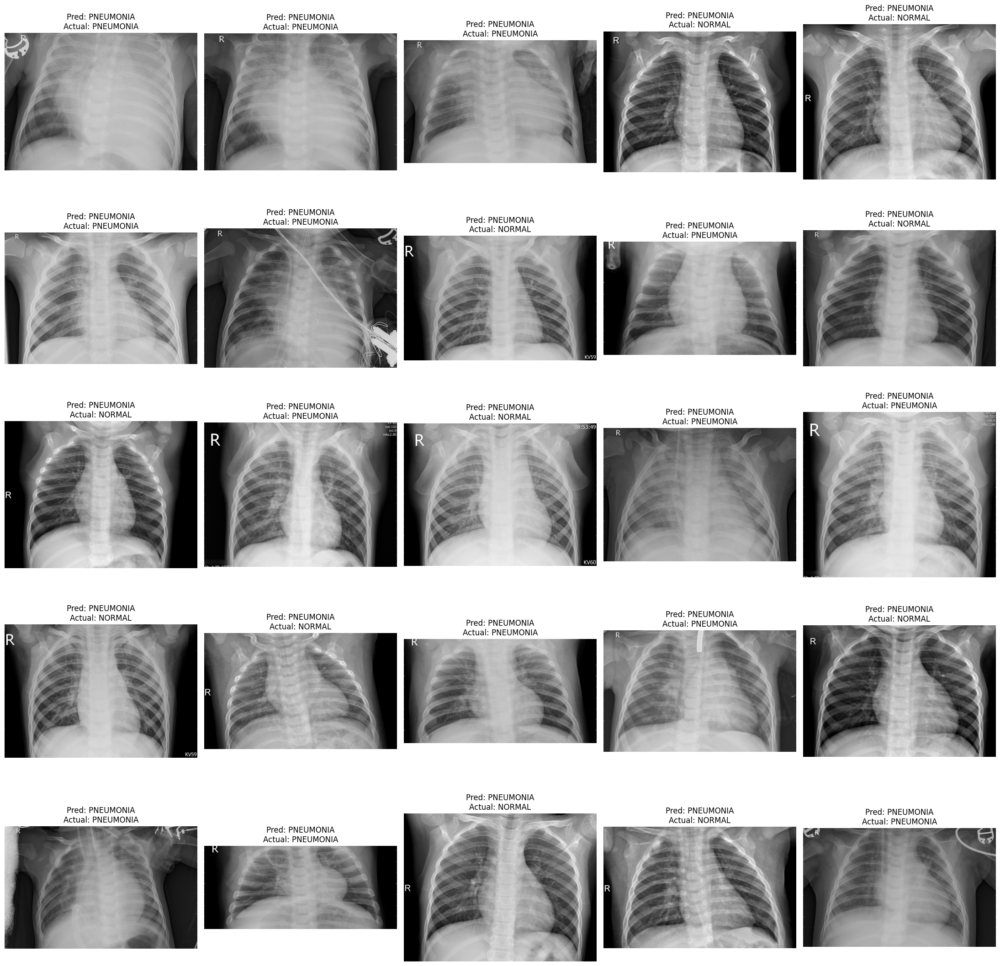

In [68]:
import os
import random
import torch
import matplotlib.pyplot as plt
from PIL import Image, ImageOps
from torchvision import transforms

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Test directory
test_dir = "/content/Chest_XRay_Datasets/test"
test_dir_folders = os.listdir(test_dir)

# Grayscale transform (your CNN expects 1 channel)
transformation = transforms.Compose([
    transforms.Grayscale(num_output_channels=1),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

# Preprocessing function
def preprocessing(image):
    img = transformation(image)
    img = img.unsqueeze(0)
    return img

# Class labels
class_names = {0: 'NORMAL', 1: 'PNEUMONIA'}

# Plotting grid (5x5)
fig, axes = plt.subplots(5, 5, figsize=(22, 22))
axes = axes.ravel()

# Generate 25 random predictions
for i in range(25):
    img_folder = random.choice(test_dir_folders)
    img_filenames = os.listdir(os.path.join(test_dir, img_folder))
    img_path = os.path.join(test_dir, img_folder, random.choice(img_filenames))

    image = Image.open(img_path).convert("L")   # convert to grayscale

    # Preprocess
    preprocessed_img = preprocessing(image)
    preprocessed_img = preprocessed_img.to(device)

    # Prediction
    with torch.no_grad():
        output = model(preprocessed_img)
        pred = torch.argmax(output).item()

    predicted_label = class_names[pred]
    actual_label = img_folder

    # Display on grid
    axes[i].imshow(image, cmap='gray')
    axes[i].set_title(
        f"Pred: {predicted_label}\nActual: {actual_label}",
        fontsize=12
    )
    axes[i].axis('off')

plt.tight_layout()
plt.show()


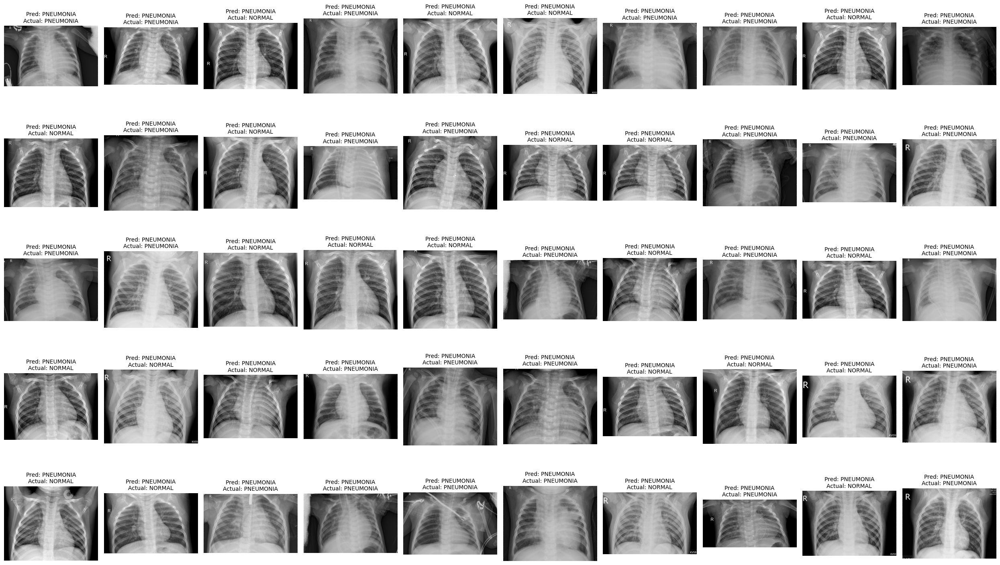

In [69]:
import os
import random
import torch
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import transforms

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Test directory
test_dir = "/content/Chest_XRay_Datasets/test"
test_dir_folders = os.listdir(test_dir)

# Grayscale transform for your model
transformation = transforms.Compose([
    transforms.Grayscale(num_output_channels=1),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

# Preprocessing
def preprocessing(image):
    img = transformation(image)
    img = img.unsqueeze(0)
    return img

# Class dictionary
class_names = {0: 'NORMAL', 1: 'PNEUMONIA'}

# 5 rows × 10 columns
fig, axes = plt.subplots(5, 10, figsize=(25, 15))
axes = axes.ravel()

for i in range(50):
    # Random image pick
    img_folder = random.choice(test_dir_folders)
    img_filenames = os.listdir(os.path.join(test_dir, img_folder))
    img_path = os.path.join(test_dir, img_folder, random.choice(img_filenames))

    image = Image.open(img_path).convert("L")  # grayscale

    # Preprocess
    pre_img = preprocessing(image).to(device)

    # Prediction
    with torch.no_grad():
        output = model(pre_img)
        pred = torch.argmax(output).item()

    predicted = class_names[pred]
    actual = img_folder

    # Show image
    axes[i].imshow(image, cmap='gray')
    axes[i].set_title(f"Pred: {predicted}\nActual: {actual}", fontsize=10)
    axes[i].axis("off")

plt.tight_layout()
plt.show()
